# Giga Recurrent Unbounded Network ➿

In [1]:
import torch
from torch.utils.data import DataLoader, Dataset, SequentialSampler, RandomSampler
import pandas as pd
import numpy as np
from sklearn.preprocessing import Normalizer, MinMaxScaler
import wandb
from IPython.display import Markdown

## Data Preprocessing & Loading

In [1]:
%run ./Modules/DataPreprocessing.ipynb

### Training Dataframe

,INV01_CurrentDC(A),INV01_CurrentAC(A),INV01_TotalEnergy(kWh),INV01_PowerAC(kW),INV01_PowerDC(kW),INV01_InternalTemperature(C),INV01_HeatSinkTemperature(C),INV01_VoltageDC(V),INV01_VoltageAC(V),INV02_CurrentDC(A),...,rain (mm),cloudcover (%),soil_temperature_7_to_28cm (°C),soil_moisture_7_to_28cm (m³/m³),minute_sin,minute_cos,day_sin,day_cos,target,isday
timestamp,,,,,,,,,,,,,,,,,,,,,
2022-06-01 00:00:00,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.066667,0.377522,0.135593,0.788675,0.788675,0.567186,0.826064,0.0,0.0
2022-06-01 00:15:00,0.0,0.0,0.154618,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.100000,0.719020,0.362712,1.000000,0.211325,0.600779,0.989739,0.0,0.0
2022-06-01 00:30:00,0.0,0.0,0.154618,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.100000,0.719020,0.362712,0.211325,0.000000,0.600779,0.989739,0.0,0.0
2022-06-01 00:45:00,0.0,0.0,0.154618,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.100000,0.719020,0.362712,0.000000,0.788675,0.600779,0.989739,0.0,0.0
2022-06-01 01:00:00,0.0,0.0,0.154618,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.113333,0.713256,0.362712,0.788675,1.000000,0.600779,0.989739,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-12-31 22:45:00,0.0,0.0,1.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.550000,0.221902,0.718644,0.000000,0.788675,0.500000,1.000000,0.0,0.0
2022-12-31 23:00:00,0.0,0.0,1.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.183333,0.213256,0.718644,0.788675,1.000000,0.500000,1.000000,0.0,0.0
2022-12-31 23:15:00,0.0,0.0,1.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.208934,0.718644,1.000000,0.211325,0.500000,1.000000,0.0,0.0


### Validation Dataframe

,INV01_CurrentDC(A),INV01_CurrentAC(A),INV01_TotalEnergy(kWh),INV01_PowerAC(kW),INV01_PowerDC(kW),INV01_InternalTemperature(C),INV01_HeatSinkTemperature(C),INV01_VoltageDC(V),INV01_VoltageAC(V),INV02_CurrentDC(A),...,rain (mm),cloudcover (%),soil_temperature_7_to_28cm (°C),soil_moisture_7_to_28cm (m³/m³),minute_sin,minute_cos,day_sin,day_cos,target,isday
timestamp,,,,,,,,,,,,,,,,,,,,,
2023-01-01 00:00:00,0.0,0.0,0.563588,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.037464,0.372881,0.788675,0.788675,0.567186,0.826064,0.0,0.0
2023-01-01 00:15:00,0.0,0.0,1.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.208934,0.718644,1.000000,0.211325,0.600779,0.989739,0.0,0.0
2023-01-01 00:30:00,0.0,0.0,1.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.208934,0.718644,0.211325,0.000000,0.600779,0.989739,0.0,0.0
2023-01-01 00:45:00,0.0,0.0,1.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.208934,0.718644,0.000000,0.788675,0.600779,0.989739,0.0,0.0
2023-01-01 01:00:00,0.0,0.0,1.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.206052,0.718644,0.788675,1.000000,0.600779,0.989739,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-01-31 22:45:00,0.0,0.0,1.065661,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.340000,0.109510,0.945763,0.000000,0.788675,0.500000,1.000000,0.0,0.0
2023-01-31 23:00:00,0.0,0.0,1.065661,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.406667,0.106628,0.945763,0.788675,1.000000,0.500000,1.000000,0.0,0.0
2023-01-31 23:15:00,0.0,0.0,1.065661,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.440000,0.105187,0.945763,1.000000,0.211325,0.500000,1.000000,0.0,0.0


### Testing Dataframe

,INV01_CurrentDC(A),INV01_CurrentAC(A),INV01_TotalEnergy(kWh),INV01_PowerAC(kW),INV01_PowerDC(kW),INV01_InternalTemperature(C),INV01_HeatSinkTemperature(C),INV01_VoltageDC(V),INV01_VoltageAC(V),INV02_CurrentDC(A),...,rain (mm),cloudcover (%),soil_temperature_7_to_28cm (°C),soil_moisture_7_to_28cm (m³/m³),minute_sin,minute_cos,day_sin,day_cos,target,isday
timestamp,,,,,,,,,,,,,,,,,,,,,
2023-02-01 00:00:00,0.000000,0.000000,0.607363,0.000000,0.000000,0.000000,0.000000,0.00000,0.00000,0.0,...,0.000000,0.293333,-0.031700,0.524294,0.788675,0.788675,0.567186,0.826064,0.0,0.0
2023-02-01 00:15:00,0.000000,0.000000,1.065661,0.000000,0.000000,0.000000,0.000000,0.00000,0.00000,0.0,...,0.000000,0.440000,0.105187,0.945763,1.000000,0.211325,0.600779,0.989739,0.0,0.0
2023-02-01 00:30:00,0.000000,0.000000,1.065661,0.000000,0.000000,0.000000,0.000000,0.00000,0.00000,0.0,...,0.000000,0.440000,0.105187,0.945763,0.211325,0.000000,0.600779,0.989739,0.0,0.0
2023-02-01 00:45:00,0.000000,0.000000,1.065661,0.000000,0.000000,0.000000,0.000000,0.00000,0.00000,0.0,...,0.000000,0.440000,0.105187,0.945763,0.000000,0.788675,0.600779,0.989739,0.0,0.0
2023-02-01 01:00:00,0.000000,0.000000,1.065661,0.000000,0.000000,0.000000,0.000000,0.00000,0.00000,0.0,...,0.000000,0.480000,0.105187,0.943503,0.788675,1.000000,0.600779,0.989739,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-02-28 22:45:00,0.321166,0.411974,1.161360,0.409118,0.415037,0.217311,0.585633,0.83682,0.96819,0.0,...,0.021277,1.000000,0.230548,0.705085,0.000000,0.788675,0.213999,0.910151,0.0,0.0
2023-02-28 23:00:00,0.321166,0.411974,1.161360,0.409118,0.415037,0.217311,0.585633,0.83682,0.96819,0.0,...,0.007092,1.000000,0.227666,0.705085,0.788675,1.000000,0.213999,0.910151,0.0,0.0
2023-02-28 23:15:00,0.321166,0.411974,1.161360,0.409118,0.415037,0.217311,0.585633,0.83682,0.96819,0.0,...,0.000000,1.000000,0.226225,0.705085,1.000000,0.211325,0.213999,0.910151,0.0,0.0


In [2]:
class CustomDataset(Dataset):
    MAX_DAYS = 15
    MIN_DAYS = 1
    DAY_IN_TIMESTAMPS = 96 # 15 min

    def __init__(self, df, batch_size):
        self.df = df
        self.batch_size = batch_size
        self.counter = 0
        self.target_len = -1
    
    def __len__(self):
        return int(len(self.df)/self.DAY_IN_TIMESTAMPS)-2 - self.MAX_DAYS
    
    def __getitem__(self, idx):
        if self.counter == self.batch_size:
            self.counter = 0
        
        if self.counter == 0:
            self.target_len = np.random.randint(1, self.MAX_DAYS+1)
        
        tmp_df = self.df.iloc[0+(self.DAY_IN_TIMESTAMPS*(idx+1)) - self.DAY_IN_TIMESTAMPS : (self.DAY_IN_TIMESTAMPS*(idx+1))+(self.DAY_IN_TIMESTAMPS*self.target_len) + self.DAY_IN_TIMESTAMPS]
        timestamps = tmp_df.index
        #timestamps = tmp_df['timestamp']
        #tmp_df = tmp_df.drop(columns=['timestamp'])

        mask_before = np.array([1]*self.DAY_IN_TIMESTAMPS + [0]*(len(tmp_df) - self.DAY_IN_TIMESTAMPS))
        mask_after = np.array([0] * (len(tmp_df) - self.DAY_IN_TIMESTAMPS) + [1]*self.DAY_IN_TIMESTAMPS)
        mask_target = np.array([0]*self.DAY_IN_TIMESTAMPS + [1] * (len(tmp_df) - self.DAY_IN_TIMESTAMPS*2) +[0] * self.DAY_IN_TIMESTAMPS)
        
        # print(len(mask_target), f"{timestamps[0]}-{timestamps[-1]}")
        
        before = tmp_df[mask_before == 1]
        target = tmp_df[mask_target == 1]
        after  = tmp_df[mask_after == 1]
        
        future = target.copy()
        future = future[[
            'Impianto_SolargisGHI(W/m2)','Impianto_SolargisGTI(W/m2)', 
            'month_sin', 'month_cos', 'hour_sin', 'hour_cos', 'minute_sin', 'minute_cos', 'day_sin', 'day_cos',
            'temperature_2m (°C)', 'relativehumidity_2m (%)', 'dewpoint_2m (°C)', 
            'rain (mm)', 'cloudcover (%)', 'soil_temperature_7_to_28cm (°C)', 'soil_moisture_7_to_28cm (m³/m³)',
            'isday',
            #'is_day ()',
        ]]
        
        tsolargis = target[['Impianto_SolargisGHI(W/m2)','Impianto_SolargisGTI(W/m2)']].copy()
        tsolargis.columns = ['GHI', 'GTI']
        
        target = target['target']
        
        self.counter += 1
        
        #print(mask_before)
        #print(mask_target)
        #print(mask_after)
        
        return before, target, future, after, mask_before, mask_target, mask_after, timestamps, tsolargis
    
    def reset(self):
        self.counter = 0

### Tests

In [13]:
train_dataset = CustomDataset(train_df, BATCH_SIZE)

In [14]:
len(train_dataset)

197

In [15]:
b, t, f, a, mask_b, mask_t, mask_a, timestamps = train_dataset[0]

print(len(mask_b), len(mask_t), len(mask_a))

display(Markdown("### Before"))
display(b)
display(Markdown("### Target"))
display(t)
display(Markdown("### Future"))
display(f)
display(Markdown("### After"))
display(a)
display(Markdown("### Timestamps"))
display(timestamps)


1344 1344 1344


### Before

,INV01_CurrentDC(A),INV01_CurrentAC(A),INV01_TotalEnergy(kWh),INV01_PowerAC(kW),INV01_PowerDC(kW),INV01_InternalTemperature(C),INV01_HeatSinkTemperature(C),INV01_VoltageDC(V),INV01_VoltageAC(V),INV02_CurrentDC(A),...,dewpoint_2m (°C),rain (mm),cloudcover (%),soil_temperature_7_to_28cm (°C),soil_moisture_7_to_28cm (m³/m³),minute_sin,minute_cos,day_sin,day_cos,target
timestamp,,,,,,,,,,,,,,,,,,,,,
2022-06-01 00:00:00,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.465517,0.0,0.066667,0.377522,0.135593,0.788675,0.788675,0.567186,0.826064,0.0
2022-06-01 00:15:00,0.0,0.0,0.154618,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.715517,0.0,0.100000,0.719020,0.362712,1.000000,0.211325,0.600779,0.989739,0.0
2022-06-01 00:30:00,0.0,0.0,0.154618,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.715517,0.0,0.100000,0.719020,0.362712,0.211325,0.000000,0.600779,0.989739,0.0
2022-06-01 00:45:00,0.0,0.0,0.154618,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.715517,0.0,0.100000,0.719020,0.362712,0.000000,0.788675,0.600779,0.989739,0.0
2022-06-01 01:00:00,0.0,0.0,0.154618,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.715517,0.0,0.113333,0.713256,0.362712,0.788675,1.000000,0.600779,0.989739,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-06-01 22:45:00,0.0,0.0,0.160364,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.741379,0.0,0.000000,0.719020,0.352542,0.000000,0.788675,0.600779,0.989739,0.0
2022-06-01 23:00:00,0.0,0.0,0.160364,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.706897,0.0,0.000000,0.707493,0.352542,0.788675,1.000000,0.600779,0.989739,0.0
2022-06-01 23:15:00,0.0,0.0,0.160364,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.689655,0.0,0.000000,0.701729,0.352542,1.000000,0.211325,0.600779,0.989739,0.0


### Target

timestamp
2022-06-02 00:00:00    0.0
2022-06-02 00:15:00    0.0
2022-06-02 00:30:00    0.0
2022-06-02 00:45:00    0.0
2022-06-02 01:00:00    0.0
                      ... 
2022-06-13 22:45:00    0.0
2022-06-13 23:00:00    0.0
2022-06-13 23:15:00    0.0
2022-06-13 23:30:00    0.0
2022-06-13 23:45:00    0.0
Freq: 15T, Name: target, Length: 1152, dtype: float64

### Future

,Impianto_SolargisGHI(W/m2),Impianto_SolargisGTI(W/m2),month_sin,month_cos,hour_sin,hour_cos,minute_sin,minute_cos,day_sin,day_cos,temperature_2m (°C),relativehumidity_2m (%),dewpoint_2m (°C),rain (mm),cloudcover (%),soil_temperature_7_to_28cm (°C),soil_moisture_7_to_28cm (m³/m³)
timestamp,,,,,,,,,,,,,,,,,
2022-06-02 00:00:00,0.0,0.0,1.0,0.166667,0.50000,0.833333,0.788675,0.788675,0.631621,0.805821,0.302222,0.352381,0.448276,0.0,0.0,0.365994,0.128814
2022-06-02 00:15:00,0.0,0.0,1.0,0.000000,0.50000,1.000000,1.000000,0.211325,0.697431,0.959375,0.523333,0.742857,0.689655,0.0,0.0,0.701729,0.352542
2022-06-02 00:30:00,0.0,0.0,1.0,0.000000,0.50000,1.000000,0.211325,0.000000,0.697431,0.959375,0.523333,0.742857,0.689655,0.0,0.0,0.701729,0.352542
2022-06-02 00:45:00,0.0,0.0,1.0,0.000000,0.50000,1.000000,0.000000,0.788675,0.697431,0.959375,0.523333,0.742857,0.689655,0.0,0.0,0.701729,0.352542
2022-06-02 01:00:00,0.0,0.0,1.0,0.000000,0.62941,0.982963,0.788675,1.000000,0.697431,0.959375,0.532222,0.714286,0.681034,0.0,0.0,0.695965,0.354802
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-06-13 22:45:00,0.0,0.0,1.0,0.000000,0.25000,0.933013,0.000000,0.788675,0.742963,0.060416,0.566667,0.600000,0.655172,0.0,0.0,0.723343,0.542373
2022-06-13 23:00:00,0.0,0.0,1.0,0.000000,0.37059,0.982963,0.788675,1.000000,0.742963,0.060416,0.557778,0.609524,0.649425,0.0,0.0,0.714697,0.542373
2022-06-13 23:15:00,0.0,0.0,1.0,0.000000,0.37059,0.982963,1.000000,0.211325,0.742963,0.060416,0.553333,0.614286,0.646552,0.0,0.0,0.710375,0.542373


### After

,INV01_CurrentDC(A),INV01_CurrentAC(A),INV01_TotalEnergy(kWh),INV01_PowerAC(kW),INV01_PowerDC(kW),INV01_InternalTemperature(C),INV01_HeatSinkTemperature(C),INV01_VoltageDC(V),INV01_VoltageAC(V),INV02_CurrentDC(A),...,dewpoint_2m (°C),rain (mm),cloudcover (%),soil_temperature_7_to_28cm (°C),soil_moisture_7_to_28cm (m³/m³),minute_sin,minute_cos,day_sin,day_cos,target
timestamp,,,,,,,,,,,,,,,,,,,,,
2022-06-14 00:00:00,0.0,0.0,0.038736,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.419540,0.0,0.0,0.371758,0.255367,0.788675,0.788675,0.599916,0.179850,0.0
2022-06-14 00:15:00,0.0,0.0,0.212721,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.646552,0.0,0.0,0.710375,0.542373,1.000000,0.211325,0.649874,0.020417,0.0
2022-06-14 00:30:00,0.0,0.0,0.212721,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.646552,0.0,0.0,0.710375,0.542373,0.211325,0.000000,0.649874,0.020417,0.0
2022-06-14 00:45:00,0.0,0.0,0.212721,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.646552,0.0,0.0,0.710375,0.542373,0.000000,0.788675,0.649874,0.020417,0.0
2022-06-14 01:00:00,0.0,0.0,0.212721,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.635057,0.0,0.0,0.704611,0.542373,0.788675,1.000000,0.649874,0.020417,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-06-14 22:45:00,0.0,0.0,0.218543,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.693966,0.0,0.0,0.749280,0.525424,0.000000,0.788675,0.649874,0.020417,0.0
2022-06-14 23:00:00,0.0,0.0,0.218543,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.685345,0.0,0.0,0.743516,0.525424,0.788675,1.000000,0.649874,0.020417,0.0
2022-06-14 23:15:00,0.0,0.0,0.218543,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.681034,0.0,0.0,0.740634,0.525424,1.000000,0.211325,0.649874,0.020417,0.0


### Timestamps

DatetimeIndex(['2022-06-01 00:00:00', '2022-06-01 00:15:00',
               '2022-06-01 00:30:00', '2022-06-01 00:45:00',
               '2022-06-01 01:00:00', '2022-06-01 01:15:00',
               '2022-06-01 01:30:00', '2022-06-01 01:45:00',
               '2022-06-01 02:00:00', '2022-06-01 02:15:00',
               ...
               '2022-06-14 21:30:00', '2022-06-14 21:45:00',
               '2022-06-14 22:00:00', '2022-06-14 22:15:00',
               '2022-06-14 22:30:00', '2022-06-14 22:45:00',
               '2022-06-14 23:00:00', '2022-06-14 23:15:00',
               '2022-06-14 23:30:00', '2022-06-14 23:45:00'],
              dtype='datetime64[ns]', name='timestamp', length=1344, freq='15T')

In [11]:
train_dataloader = DataLoader(train_dataset, batch_size=BATCH_SIZE, collate_fn=collate_fn, shuffle=True)

In [14]:
for b_before, b_target, b_future, b_after, b_m_b, b_m_t, b_m_a, b_timestamps in train_dataloader:
    print(b_before.shape, b_target.shape, b_future.shape, b_after.shape)
train_dataset.reset()

torch.Size([10, 287, 47]) torch.Size([10, 1148, 1]) torch.Size([10, 1148, 17]) torch.Size([10, 287, 47])
torch.Size([10, 287, 47]) torch.Size([10, 287, 1]) torch.Size([10, 287, 17]) torch.Size([10, 287, 47])
torch.Size([10, 287, 47]) torch.Size([10, 1148, 1]) torch.Size([10, 1148, 17]) torch.Size([10, 287, 47])
torch.Size([10, 287, 47]) torch.Size([10, 1148, 1]) torch.Size([10, 1148, 17]) torch.Size([10, 287, 47])
torch.Size([10, 287, 47]) torch.Size([10, 1148, 1]) torch.Size([10, 1148, 17]) torch.Size([10, 287, 47])
torch.Size([10, 287, 47]) torch.Size([10, 287, 1]) torch.Size([10, 287, 17]) torch.Size([10, 287, 47])
torch.Size([10, 287, 47]) torch.Size([10, 287, 1]) torch.Size([10, 287, 17]) torch.Size([10, 287, 47])
torch.Size([10, 287, 47]) torch.Size([10, 861, 1]) torch.Size([10, 861, 17]) torch.Size([10, 287, 47])
torch.Size([10, 287, 47]) torch.Size([10, 861, 1]) torch.Size([10, 861, 17]) torch.Size([10, 287, 47])
torch.Size([10, 287, 47]) torch.Size([10, 861, 1]) torch.Size([10

In [12]:
val_dataset = CustomDataset(val_df, BATCH_SIZE)

In [13]:
val_dataloader = DataLoader(val_dataset, batch_size=BATCH_SIZE, collate_fn=collate_fn, shuffle=True)

In [17]:
for b_vbefore, b_vtarget, b_vafter, b_vm_b, b_vm_t, b_vm_a, b_vtimestamps in val_dl:
    print(b_vbefore.shape, b_vtarget.shape, b_vafter.shape)
    print()
    #display(b_timestamps[0])

1148 2023-01-01 00:05:00-2023-01-04 23:55:00
1148 2023-01-09 00:05:00-2023-01-12 23:55:00
1148 2023-01-13 00:05:00-2023-01-16 23:55:00
1148 2023-01-22 00:05:00-2023-01-25 23:55:00
1148 2023-01-05 00:05:00-2023-01-08 23:55:00
1148 2023-01-03 00:05:00-2023-01-06 23:55:00
1148 2023-01-02 00:05:00-2023-01-05 23:55:00
1148 2023-01-25 00:05:00-2023-01-28 23:55:00
1148 2023-01-15 00:05:00-2023-01-18 23:55:00
1148 2023-01-24 00:05:00-2023-01-27 23:55:00
torch.Size([10, 287, 47]) torch.Size([10, 574, 47]) torch.Size([10, 287, 47])

1722 2023-01-14 00:05:00-2023-01-19 23:55:00
1722 2023-01-08 00:05:00-2023-01-13 23:55:00
1722 2023-01-16 00:05:00-2023-01-21 23:55:00
1722 2023-01-23 00:05:00-2023-01-28 23:55:00
1722 2023-01-11 00:05:00-2023-01-16 23:55:00
1722 2023-01-07 00:05:00-2023-01-12 23:55:00
1722 2023-01-20 00:05:00-2023-01-25 23:55:00
1722 2023-01-04 00:05:00-2023-01-09 23:55:00
1722 2023-01-12 00:05:00-2023-01-17 23:55:00
1722 2023-01-06 00:05:00-2023-01-11 23:55:00
torch.Size([10, 287, 

## Model Settings

In [3]:
import torch.nn.functional as F
from torch import nn
from tqdm.auto import tqdm
import matplotlib.pyplot as plt
from torchview import draw_graph
import graphviz

graphviz.set_jupyter_format('png')

'svg'

In [4]:
device = (
    "cuda"
    if torch.cuda.is_available()
    else "mps"
    if torch.backends.mps.is_available()
    else "cpu"
)
#device = "cpu"
print(f"Using {device} device")

Using cuda device


In [5]:
run = wandb.init(
    project="interpolation",
    name="Giga Recurrent Random Unbounded Network (15 Min, 15 Buco) ➿",
    config={
        "learning_rate": 0.001,
        "architecture": "GRRUNH",
        "dataset": "RofiloAnnuale-FullCyclingEncoding",
        "epochs": 100,
        "batch_size": BATCH_SIZE, #10
        "window_size": 1,
        "target_size": 1,
    }
)

wandb: Currently logged in as: nicolo-vescera (rofilopd). Use `wandb login --relogin` to force relogin


### Model Architecture

In [6]:
%run ./Modules/ModelSettings.ipynb

In [7]:
model = NeuralNetwork().to(device)
# optimizer = torch.optim.SGD(model.parameters(), lr=run.config['learning_rate'])
optimizer = torch.optim.Adam(model.parameters(), lr=run.config['learning_rate'])

print(model)
print(optimizer)

run.config['optimizer'] = optimizer

NeuralNetwork(
  (input_before): GRU(48, 32, batch_first=True)
  (input_after): GRU(48, 32, batch_first=True)
  (flat): Flatten(start_dim=1, end_dim=-1)
  (linear1_2): Linear(in_features=64, out_features=128, bias=True)
  (linear2_2): Linear(in_features=128, out_features=128, bias=True)
  (loopGru): GRU(18, 128, batch_first=True)
  (output_layer): Linear(in_features=128, out_features=1, bias=True)
)
Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    eps: 1e-08
    lr: 0.001
    weight_decay: 0
)


In [8]:
model_graph = draw_graph(model, input_size=[(5, 287, 48), (5, 287, 48), (5, 287, 18)], save_graph=True, expand_nested=True, device=device)
model_graph.visual_graph
run.log({"Model Shape": wandb.Image("model.gv.png")})

In [26]:
batch_idx, (before, target, future, after, m_b, m_t, m_a, timestamp) = next(enumerate(train_dataloader))
before, target, future, after= before.to(device), target.to(device), future.to(device), after.to(device)

train_probs = model.test(before, after, future)

Out Encoder:  torch.Size([10, 1, 64])
Out Middle:  torch.Size([10, 1, 128])
Out Decoder:  torch.Size([10, 287, 128])
Output:  torch.Size([10, 287, 1])


### Find LR

In [19]:
def find_lr(model, train_loader, optimizer, criterion, init_value=1e-8, final_value=10.0, beta=0.98):
    num = len(train_loader) - 1
    mult = (final_value / init_value) ** (1/num)
    lr = init_value
    optimizer.param_groups[0]['lr'] = lr
    avg_loss = 0.0
    best_loss = 0.0
    losses = []
    log_lrs = []

    #    for batch_idx, (before, target, future, after, m_b, b_t, m_a, timestamps) in enumerate(train_dataloader):        

    for batch_num, (before, target, future, after, m_b, b_t, m_a, timestamps) in enumerate(train_loader, 1):
        #inputs, targets = data
        optimizer.zero_grad()
        outputs = model(before, after, future)
        loss = criterion(outputs, target)
        avg_loss = beta * avg_loss + (1 - beta) * loss.data.item()
        smoothed_loss = avg_loss / (1 - beta**batch_num)
        if batch_num > 1 and smoothed_loss > 4 * best_loss:
            break
        if smoothed_loss < best_loss or batch_num == 1:
            best_loss = smoothed_loss
        losses.append(smoothed_loss)
        #log_lrs.append(math.log10(lr))
        log_lrs.append(np.log10(lr))

        loss.backward()
        optimizer.step()

        lr *= mult
        optimizer.param_groups[0]['lr'] = lr

    plt.plot(log_lrs[10:-5], losses[10:-5])
    plt.xlabel('Log Learning Rate')
    plt.ylabel('Loss')
    plt.show()

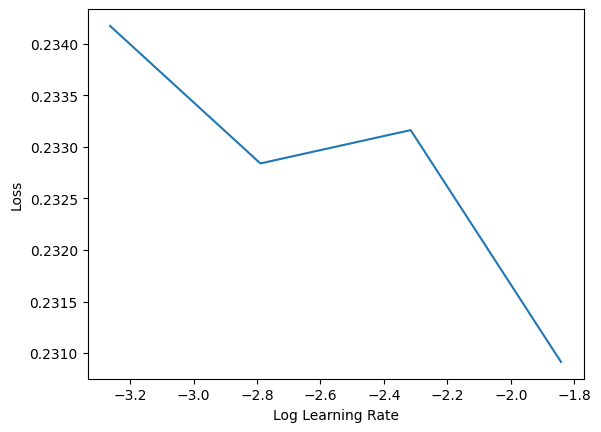

In [27]:
# TODO: cercare pytorch lighning
train_dataset = CustomDataset(train_df, BATCH_SIZE)
train_dataloader = DataLoader(train_dataset, batch_size=BATCH_SIZE, collate_fn=collate_fn, shuffle=True, drop_last=True)
loss = nn.L1Loss()
model = NeuralNetwork()
optimizer = torch.optim.SGD(model.parameters(), lr=0.001)

find_lr(model, train_dataloader, optimizer, loss)

## Training

  0%|          | 0/100 [00:00<?, ?epoch/s]

Epoch 01/100 | Train Loss 0.153 | Val Loss 0.085
	Saving model (improve loss) 1000000.0 -> 0.08531522005796432
Epoch 02/100 | Train Loss 0.133 | Val Loss 0.084
	Saving model (improve loss) 0.08531522005796432 -> 0.08369265496730804
Epoch 03/100 | Train Loss 0.139 | Val Loss 0.088
Epoch 04/100 | Train Loss 0.117 | Val Loss 0.073
	Saving model (improve loss) 0.08369265496730804 -> 0.07286755740642548
Epoch 05/100 | Train Loss 0.117 | Val Loss 0.077
Epoch 06/100 | Train Loss 0.069 | Val Loss 0.061
	Saving model (improve loss) 0.07286755740642548 -> 0.061101000756025314
Epoch 07/100 | Train Loss 0.048 | Val Loss 0.042
	Saving model (improve loss) 0.061101000756025314 -> 0.04224013537168503
Epoch 08/100 | Train Loss 0.047 | Val Loss 0.043
Epoch 09/100 | Train Loss 0.042 | Val Loss 0.042
	Saving model (improve loss) 0.04224013537168503 -> 0.04204261302947998
Epoch 10/100 | Train Loss 0.031 | Val Loss 0.042
	Saving model (improve loss) 0.04204261302947998 -> 0.041951049119234085
Epoch 11/100 

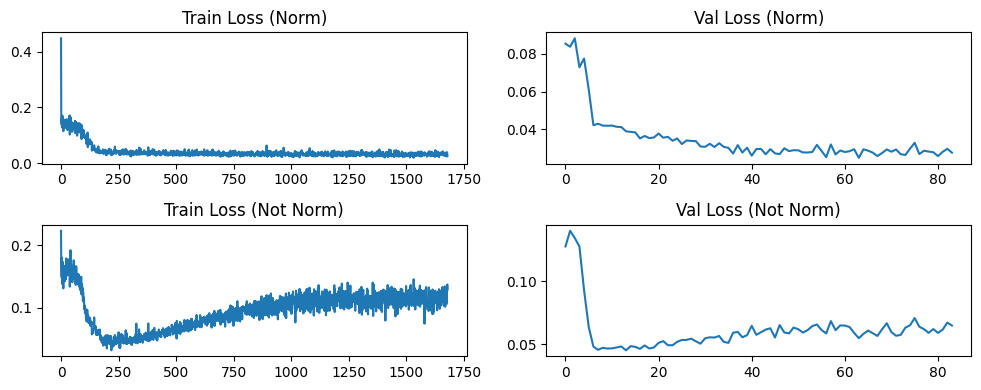

In [9]:
# definizione datasets e dataloaders
# vengono istanziati ogni volta che la run ha inizio così da gestire meglio ed impedire
# errori sul calcolo dei batch
train_dataset = CustomDataset(train_df, BATCH_SIZE)
train_dataloader = DataLoader(train_dataset, batch_size=BATCH_SIZE, collate_fn=collate_fn, shuffle=True)
val_dataset = CustomDataset(val_df, BATCH_SIZE)
val_dataloader = DataLoader(val_dataset, batch_size=BATCH_SIZE, collate_fn=collate_fn, shuffle=True)

t_loss_list, t_loss_notnorm_list, v_loss_list, v_loss_notnorm_list = [], [], [], []
loop = tqdm(range(run.config['epochs']), unit="epoch")
early_stopping = EarlyStopper(patience=20)
best_vloss = 1_000_000.
loss = nn.L1Loss()

run.config['early_stopping'] = str(early_stopping)
run.config['save_best'] = True
run.watch(model)

for epoch in loop:
    model.train()
    for batch_idx, (before, target, future, after, m_b, b_t, m_a, timestamps, _) in enumerate(train_dataloader):        
        target, before, after, future = target.to(device), before.to(device), after.to(device), future.to(device)
        
        train_pred = model(before, after, future)
        train_loss = loss((train_pred/train_pred.sum(dim=(1,2), keepdim=True)) * target.sum(dim=(1,2), keepdim=True), target)
        
        optimizer.zero_grad()
        train_loss.backward()
        optimizer.step()
        
        t_loss_list.append(train_loss.item())

        with torch.no_grad(): # TODO: ricontrollare
            t_loss_notnorm_list.append(loss(train_pred, target).item())

    model.eval()
    running_vloss = 0.0
    running_vloss_notnorm = 0.0

    # Disable gradient computation and reduce memory consumption.
    with torch.no_grad():
        for i, (vbefore, vtarget, vfuture, vafter, vm_b, vm_t, vm_a, vtimestamp, _) in enumerate(val_dataloader):
            vbefore, vtarget, vfuture, vafter = vbefore.to(device), vtarget.to(device), vfuture.to(device), vafter.to(device)
            voutputs = model(vbefore, vafter, vfuture)
            #vloss = loss(voutputs, vtarget)
            # voutputs = (voutputs * vfuture[:,:,-1].reshape(voutputs.shape)) # output * isday
            vloss = loss((voutputs/voutputs.sum(dim=(1,2), keepdim=True)) * vtarget.sum(dim=(1,2), keepdim=True), vtarget)
            vloss_notnorm = loss(voutputs, vtarget)

            running_vloss += vloss
            running_vloss_notnorm += vloss_notnorm

    # resetting dataset generation
    # TODO: fix con DROP LAST
    train_dataset.reset()
    val_dataset.reset()
    
    avg_vloss = running_vloss / (i + 1) # TODO: ricontrollare
    avg_vloss_notnorm = running_vloss_notnorm / (i + 1) # TODO: ricontrollare

    v_loss_list.append(avg_vloss.item())
    v_loss_notnorm_list.append(avg_vloss_notnorm.item())
    
    loop.set_description(f"Epoch [{epoch}/{run.config['epochs']}]")
    loop.set_postfix(loss=t_loss_list[-1], val_loss=v_loss_list[-1])
    
    run.log({"loss": t_loss_list[-1], "val_loss": v_loss_list[-1]})
    
    print(
            f"Epoch {epoch+1:02d}/{run.config['epochs']:02d}"
            f" | Train Loss {t_loss_list[-1]:.3f}"
            f" | Val Loss {v_loss_list[-1]:.3f}"
        )
    
    # save model when improves loss
    if avg_vloss < best_vloss:
        print(f"\tSaving model (improve loss) {best_vloss} -> {avg_vloss}")
        best_vloss = avg_vloss
        model_path = f"./models/GRRUN15MIN15BUCO_b{run.config['batch_size']}_e{run.config['epochs']}.model"
        torch.save(model.state_dict(), model_path)

    # check for early stopping
    if early_stopping.early_stop(v_loss_list[-1]):
        print(f"\tEarly Stopping @ epoch {epoch} loss: {t_loss_list[-1]} val_loss: {v_loss_list[-1]}")
        break

# plot training/validation loss
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(10, 4))
axes[0, 0].set_title("Train Loss (Norm)")
axes[0, 0].plot(t_loss_list)
axes[0, 1].set_title("Val Loss (Norm)")
axes[0, 1].plot(v_loss_list)
axes[1, 0].set_title("Train Loss (Not Norm)")
axes[1, 0].plot(t_loss_notnorm_list)
axes[1, 1].set_title("Val Loss (Not Norm)")
axes[1, 1].plot(v_loss_notnorm_list)
fig.tight_layout()

## Evaluation

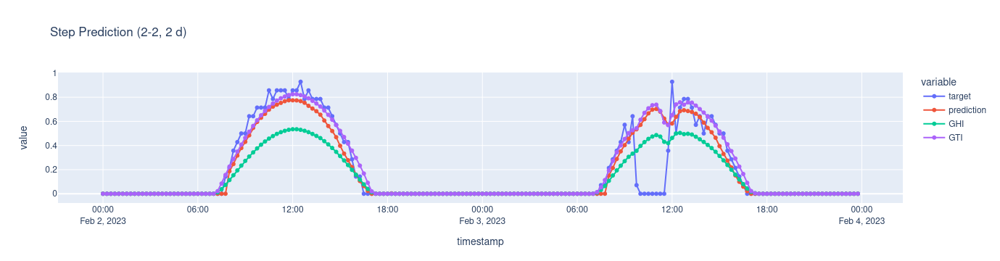

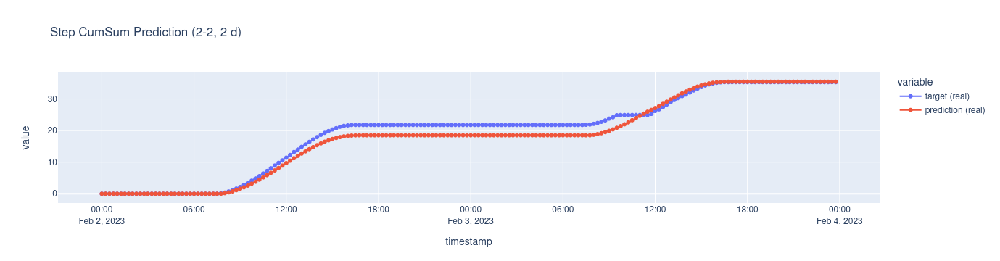

,Value
MAPE + (%),31.97
SMAPE (%),21.80
NRMSE (%),15.52
MAE (),0.06
R2,0.76
,Value ()
Day 1,1.74
Day 2,3.91
,Value
MAPE (%),9.98


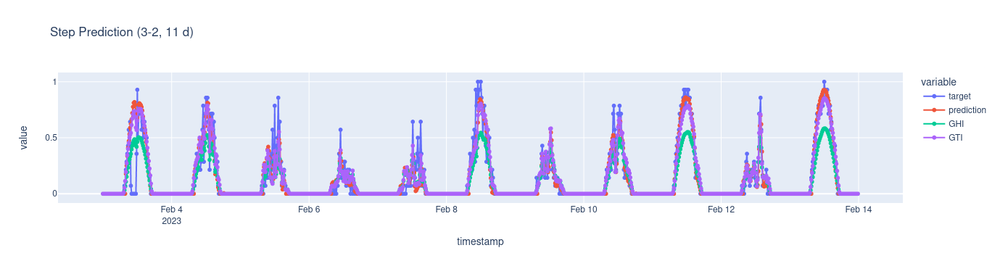

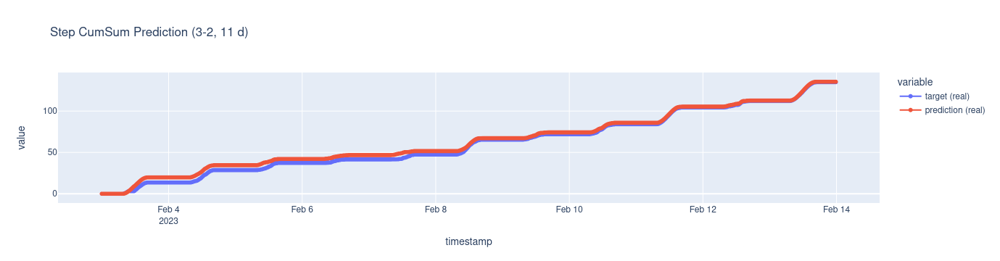

,Value
MAPE + (%),39.98
SMAPE (%),24.38
NRMSE (%),10.00
MAE (),0.04
R2,0.82
,Value ()
Day 1,0.75
Day 2,0.43
Day 3,0.44
Day 4,0.21


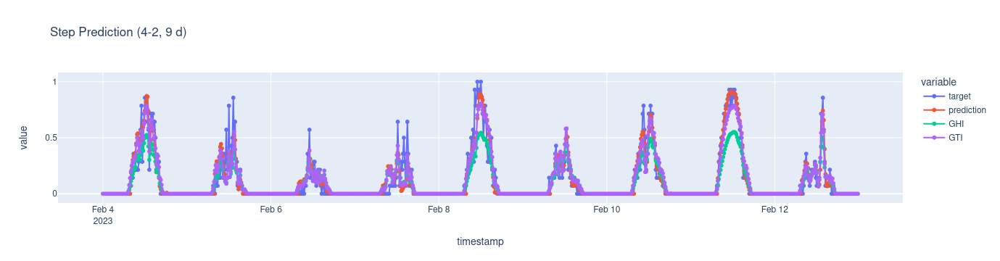

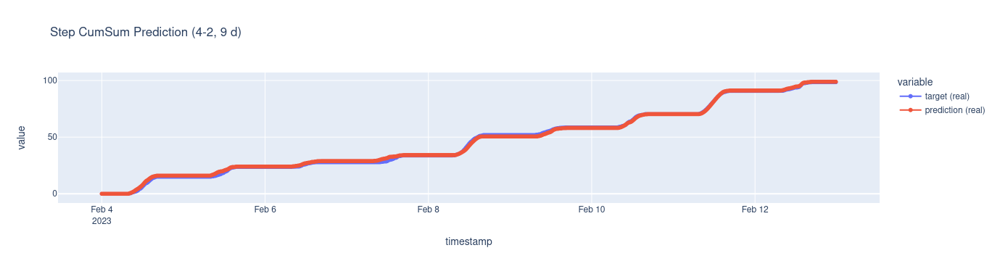

,Value
MAPE + (%),44.66
SMAPE (%),25.86
NRMSE (%),8.09
MAE (),0.04
R2,0.86
,Value ()
Day 1,0.52
Day 2,0.55
Day 3,0.27
Day 4,0.54


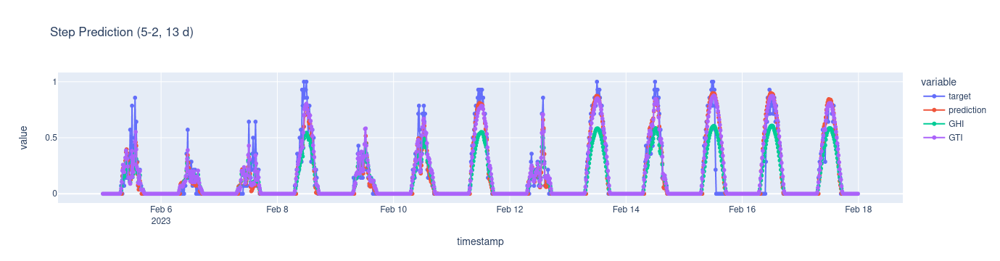

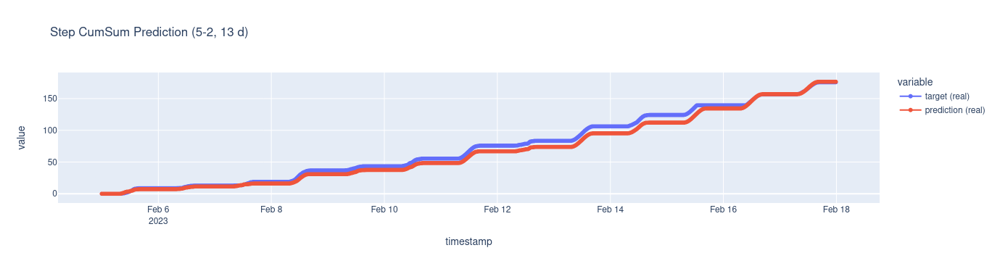

,Value
MAPE + (%),33.36
SMAPE (%),24.49
NRMSE (%),10.28
MAE (),0.04
R2,0.84
,Value ()
Day 1,0.36
Day 2,0.17
Day 3,0.36
Day 4,0.43


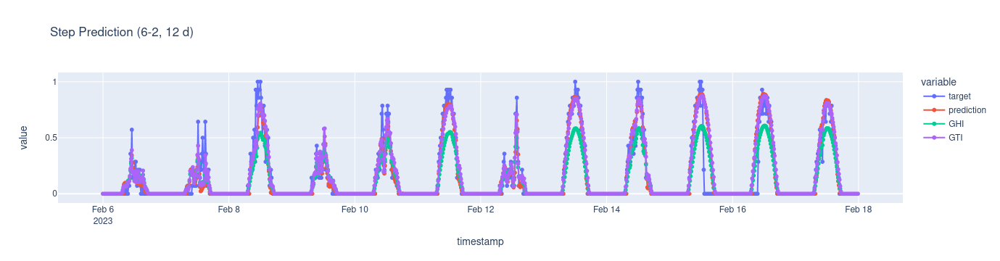

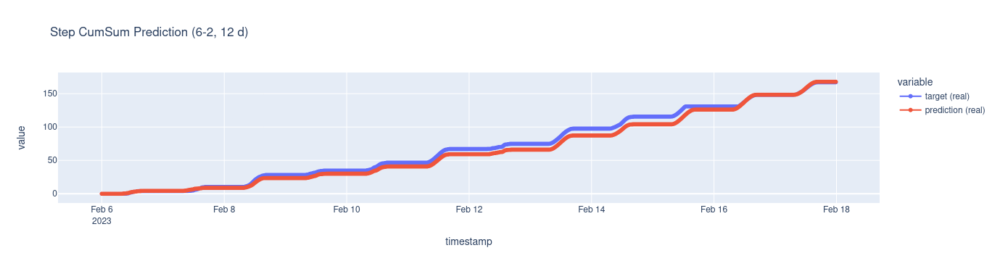

,Value
MAPE + (%),31.01
SMAPE (%),23.52
NRMSE (%),10.17
MAE (),0.04
R2,0.85
,Value ()
Day 1,0.19
Day 2,0.39
Day 3,0.47
Day 4,0.16


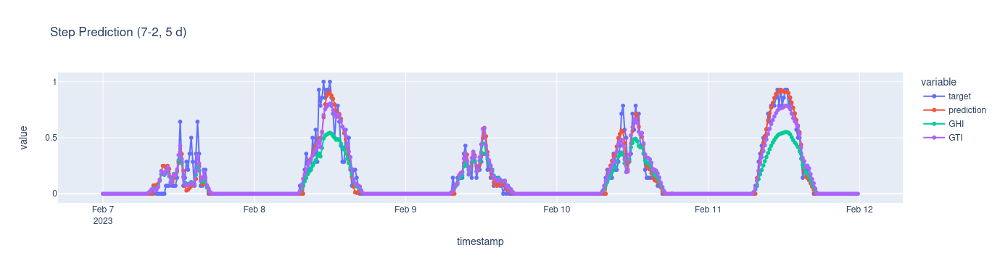

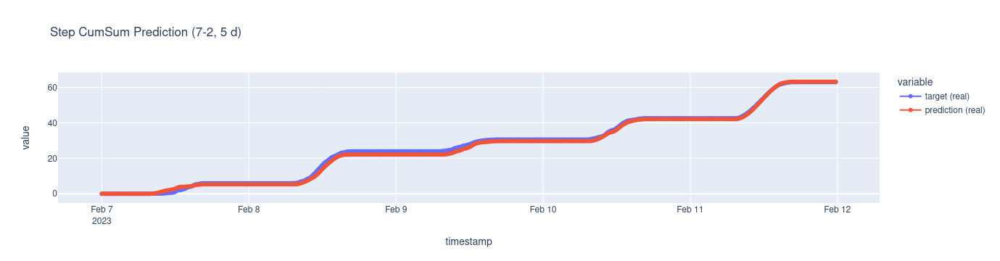

,Value
MAPE + (%),40.17
SMAPE (%),24.08
NRMSE (%),7.96
MAE (),0.04
R2,0.89
,Value ()
Day 1,0.98
Day 2,1.01
Day 3,0.46
Day 4,0.68


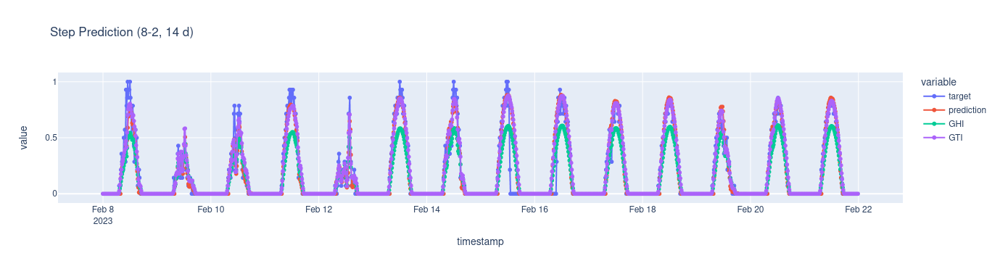

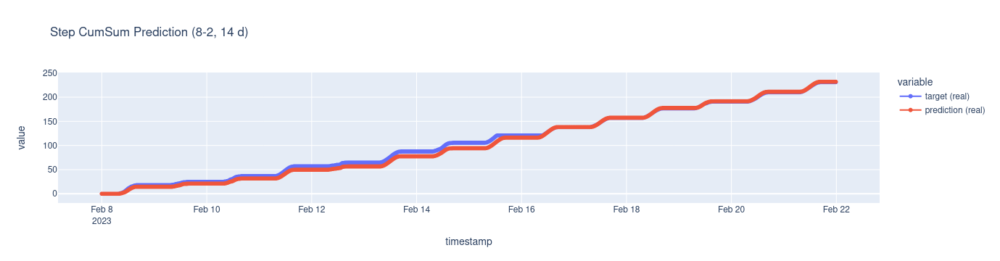

,Value
MAPE + (%),25.43
SMAPE (%),19.78
NRMSE (%),9.25
MAE (),0.04
R2,0.89
,Value ()
Day 1,0.40
Day 2,0.14
Day 3,0.23
Day 4,0.19


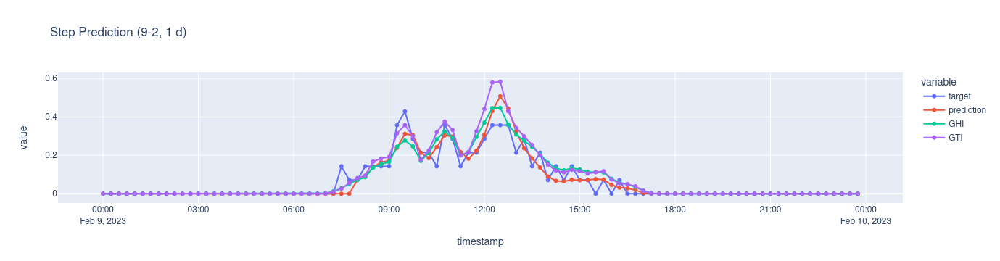

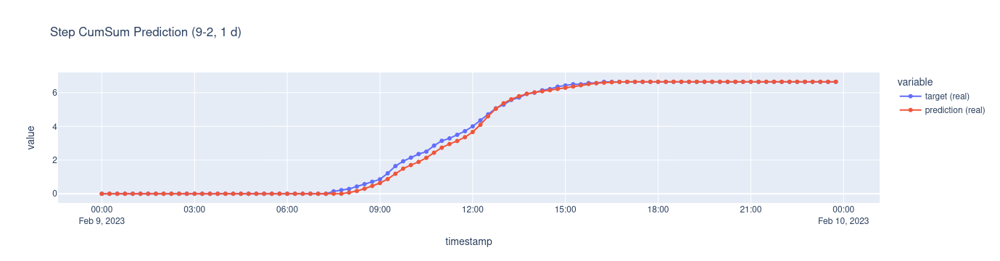

,Value
MAPE + (%),27.77
SMAPE (%),28.87
NRMSE (%),9.47
MAE (),0.02
R2,0.87
,Value ()
Day 1,1.89
,Value
MAPE (%),7.00
SMAPE (%),10.35


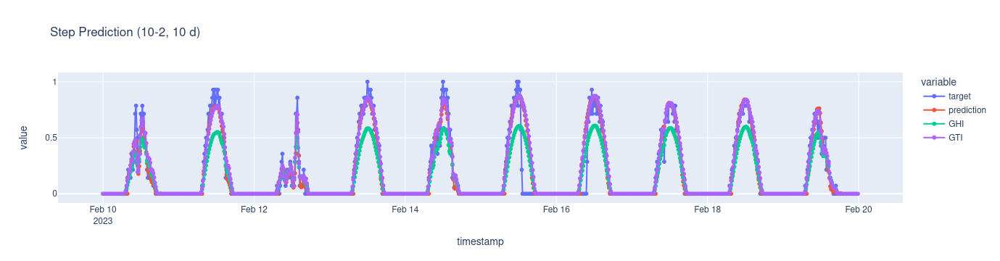

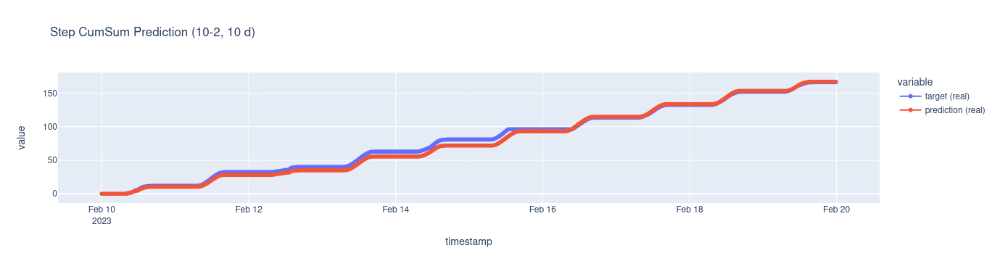

,Value
MAPE + (%),26.11
SMAPE (%),21.26
NRMSE (%),9.95
MAE (),0.04
R2,0.88
,Value ()
Day 1,0.33
Day 2,0.30
Day 3,0.29
Day 4,0.28


,Value
MAPE + (%),25.55
SMAPE (%),21.42
NRMSE (%),10.15
MAE (),0.04
R2,0.88
,Value ()
Day 1,0.35
Day 2,0.32
Day 3,0.33
Day 4,0.44


,Value
MAPE + (%),27.50
SMAPE (%),20.95
NRMSE (%),9.37
MAE (),0.04
R2,0.89
,Value ()
Day 1,0.22
Day 2,0.20
Day 3,0.29
Day 4,0.73


Mape Global:  tensor(0.3535)


In [8]:
%run ./Modules/Evaluation.ipynb
model.load_state_dict(torch.load('./models/GRRUN15MIN15BUCO_b10_e100.model'))
evaluate(model)